/usr/local/lib/python3.11/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


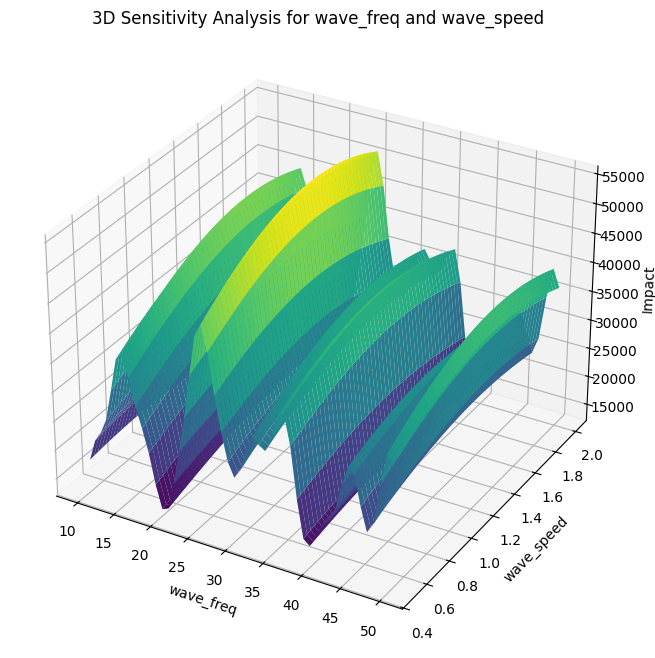

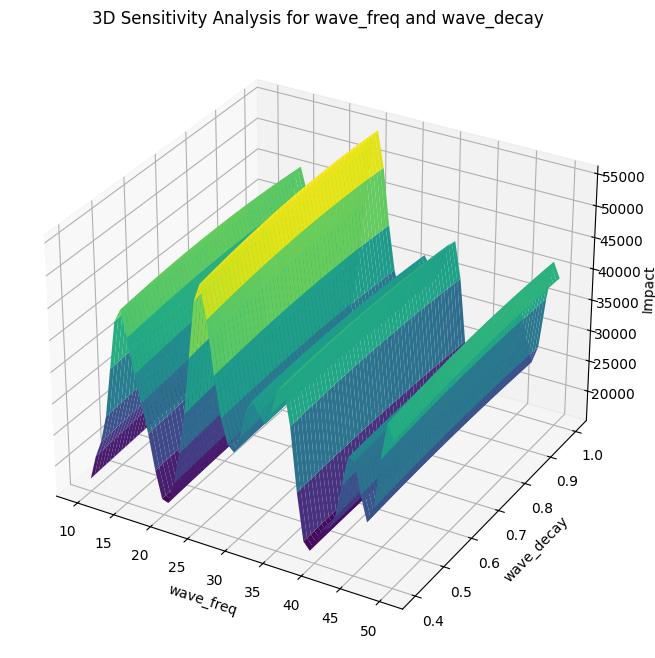

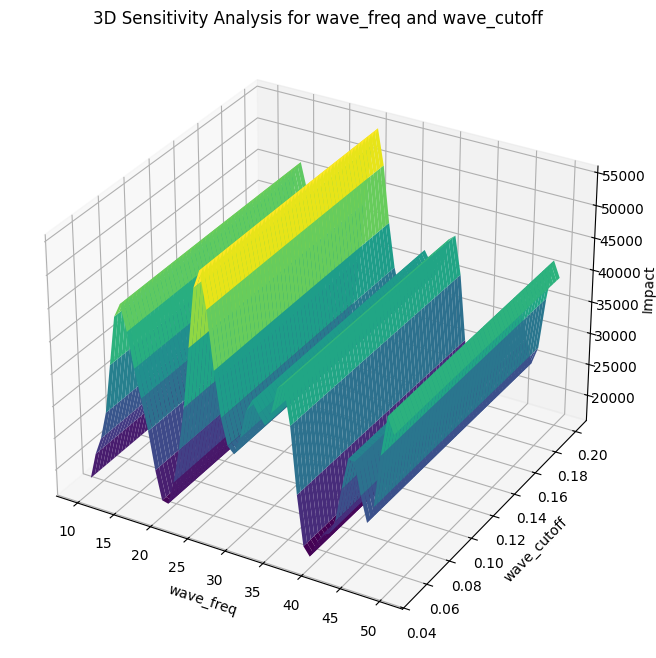

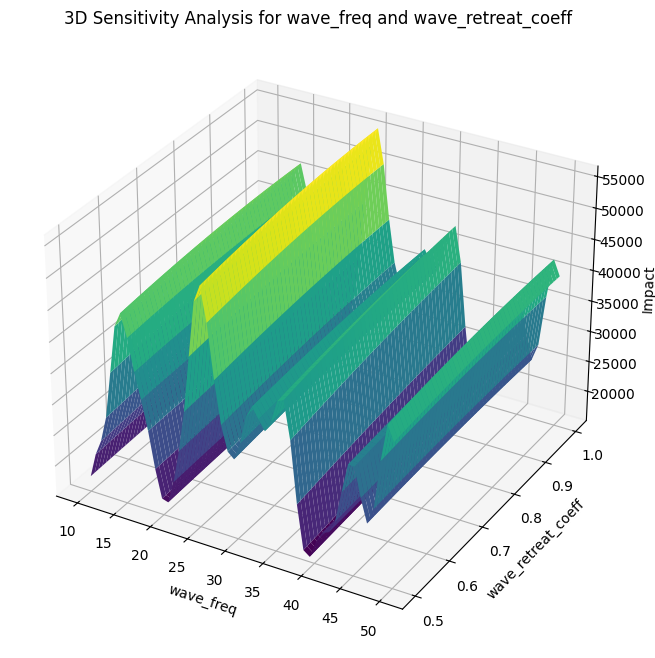

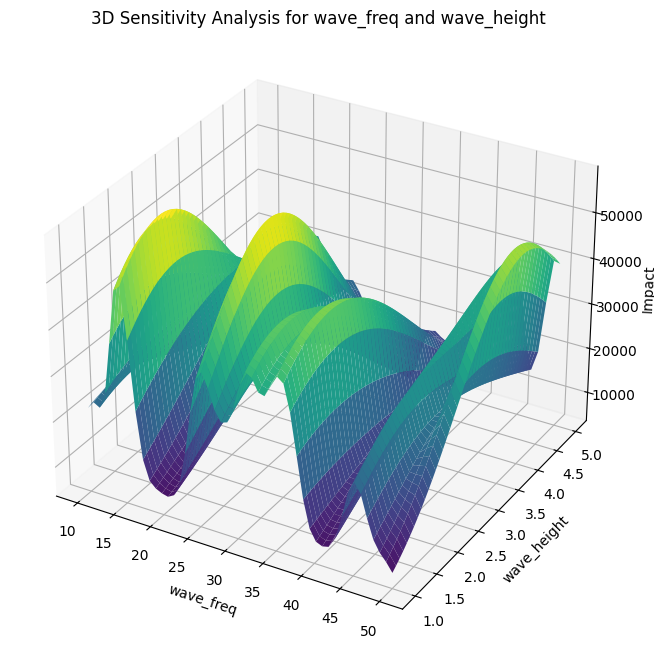

...

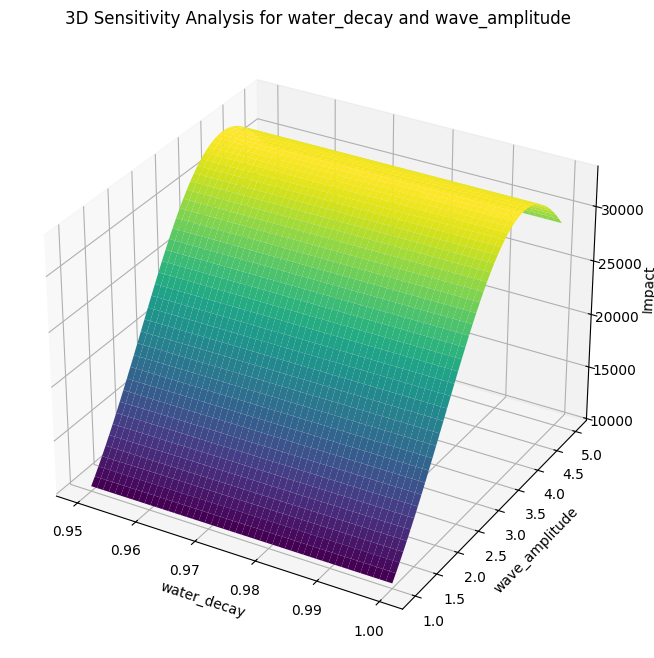

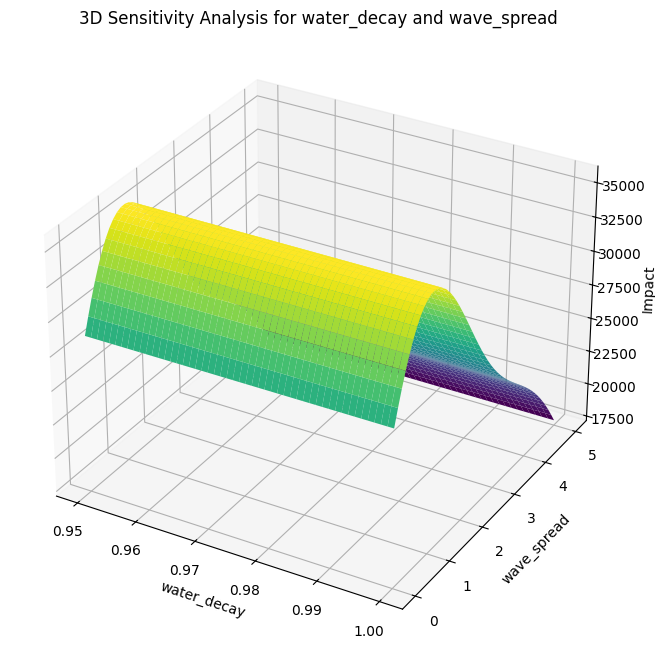

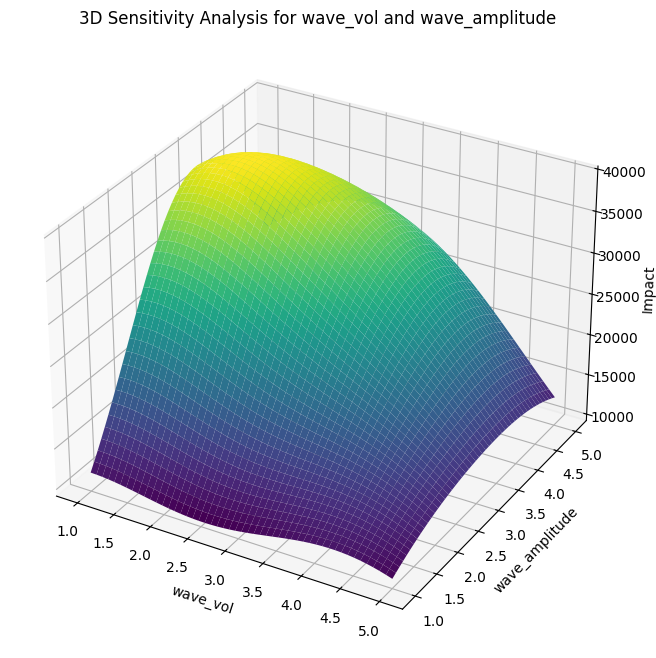

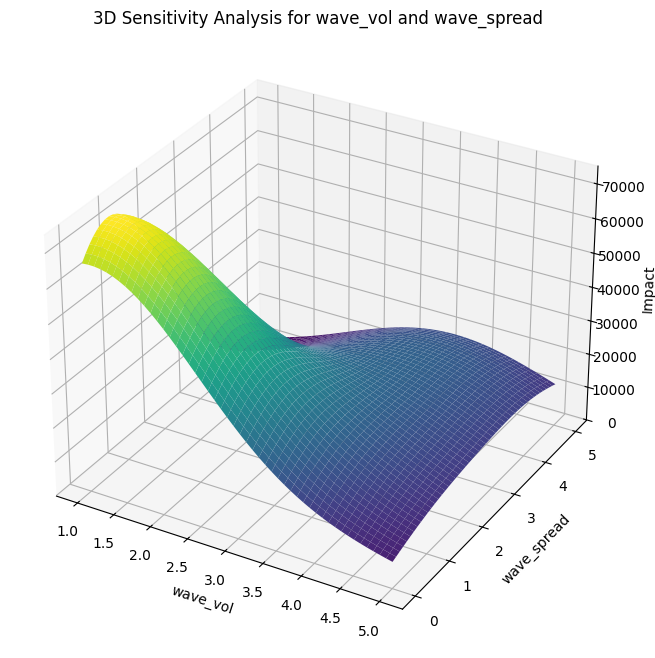

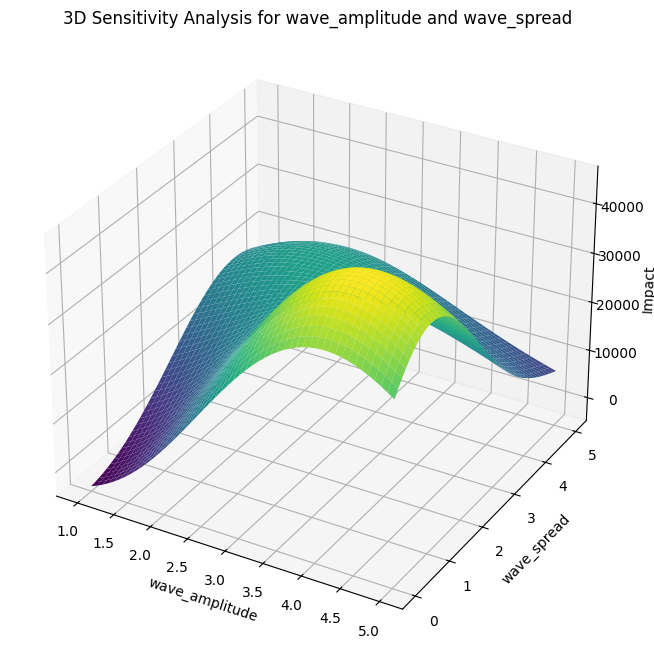

In [1]:
from IPython import get_ipython
from IPython.display import display
import os
import itertools
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel
from scipy.optimize import minimize
import seaborn as sns
from scipy.interpolate import make_interp_spline
from mpl_toolkits.mplot3d import Axes3D


def initialize_coastline(dim_map, obstacle_coords):
    grid = np.zeros((dim_map, dim_map))
    for x, y in obstacle_coords:
        grid[x, y] = -1
    return grid


def generate_wave(grid, wave_freq, wave_speed, wave_decay, wave_amplitude, wave_cutoff):
    return np.sin(np.linspace(0, wave_amplitude * wave_freq, grid.shape[0]))


def simulate_step(grid, wave_front, wave_retreat_coeff, sand_pull, ground_pull, water_decay):
    grid += wave_front * wave_retreat_coeff
    grid = np.clip(grid - sand_pull - ground_pull, 0, None) * water_decay
    return grid


def sensitivity_analysis(params, param_ranges, n_samples=100):
    dim_map = params['dim_map']
    obstacle_coords = params['obstacle_coords']
    param_ranges['wave_cutoff'] = (0.05, 0.2)

    sampled_params = []
    sampled_impacts = []

    for _ in range(n_samples):
        sample = {key: np.random.uniform(low, high)
                  for key, (low, high) in param_ranges.items()}
        grid = initialize_coastline(dim_map, obstacle_coords)
        total_impact = 0

        for step in range(10):
            wave_front = generate_wave(
                grid,
                sample['wave_freq'],
                sample['wave_speed'],
                sample['wave_decay'],
                sample['wave_amplitude'],
                sample['wave_cutoff']
            )
            grid = simulate_step(
                grid,
                wave_front,
                sample['wave_retreat_coeff'],
                sample['sand_pull'],
                sample['ground_pull'],
                sample['water_decay']
            )
            total_impact += np.sum(grid)

        sampled_params.append(list(sample.values()))
        sampled_impacts.append(total_impact)

    sampled_params = np.array(sampled_params)
    sampled_impacts = np.array(sampled_impacts)
    kernel = ConstantKernel(1.0, (1e-2, 1e2)) * RBF(1.0, (1e-2, 1e2))
    model = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10)
    model.fit(sampled_params, sampled_impacts)

    sns.set_palette("colorblind")

    # 3D Sensitivity Analysis for All Parameter Pairs
    param_names = list(param_ranges.keys())
    for i in range(len(param_names)):
        for j in range(i + 1, len(param_names)):
            param1 = param_names[i]
            param2 = param_names[j]

            param1_values = np.linspace(
                param_ranges[param1][0], param_ranges[param1][1], 50)
            param2_values = np.linspace(
                param_ranges[param2][0], param_ranges[param2][1], 50)
            X, Y = np.meshgrid(param1_values, param2_values)
            baseline = np.mean(sampled_params, axis=0)

            Z = np.zeros_like(X)
            for k in range(X.shape[0]):
                for l in range(X.shape[1]):
                    test_sample = baseline.copy()
                    test_sample[list(param_ranges.keys()).index(
                        param1)] = X[k, l]
                    test_sample[list(param_ranges.keys()).index(
                        param2)] = Y[k, l]
                    Z[k, l] = model.predict([test_sample])[0]

            fig = plt.figure(figsize=(10, 8))
            ax = fig.add_subplot(111, projection='3d')
            ax.plot_surface(X, Y, Z, cmap='viridis')
            ax.set_xlabel(param1)
            ax.set_ylabel(param2)
            ax.set_zlabel('Impact')
            plt.title(f'3D Sensitivity Analysis for {param1} and {param2}')
            plt.show()

    return model


def analyze_time_series(directory):
    data_frames = []

    for filename in os.listdir(directory):
        if filename.endswith(".csv"):
            file_path = os.path.join(directory, filename)
            try:

                df = pd.read_csv(file_path)
            except KeyError as e:
                if str(e) == "KeyError: <class 'bool'>":
                    print(f"KeyError encountered while reading {filename}. Retrying with converters...")

                    def bool_converter(val):
                        if val.lower() in ['true', '1']:
                            return True
                        elif val.lower() in ['false', '0']:
                            return False
                        else:
                            return val
                    with open(file_path, 'r') as f:
                        num_cols = len(f.readline().split(','))

                    df = pd.read_csv(file_path, converters={i: bool_converter for i in range(num_cols)})
                else:
                    raise
            data_frames.append(df)

    combined_data = pd.concat(data_frames, ignore_index=True)

params = {
    "dim_map": 100,
    "obstacle_coords": [(20, 20), (40, 40), (60, 60)]
}

param_ranges = {
    "wave_freq": (10, 50),
    "wave_speed": (0.5, 2.0),
    "wave_decay": (0.4, 1.0),
    "wave_cutoff": (0.05, 0.2),
    "wave_retreat_coeff": (0.5, 1.0),
    "wave_height": (1, 5),
    "sand_pull": (0.1, 0.5),
    "ground_pull": (0.05, 0.2),
    "water_decay": (0.95, 1.0),
    "wave_vol": (1, 5),
    "wave_amplitude": (1, 5),
    "wave_spread": (0, 5)
}

model = sensitivity_analysis(params, param_ranges, n_samples=100)
directory = "/content/drive/MyDrive/jap0171_timeseries"
combined_data = analyze_time_series(directory)

/usr/local/lib/python3.11/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/usr/local/lib/python3.11/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/usr/local/lib/python3.11/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Optimal parameters: [10, 0.5, 0.4, 0.05, 1.0, 5, 0.1, 0.05, 1.0, 1, 1, 0]
Optimal objective value: -168979.99639105168


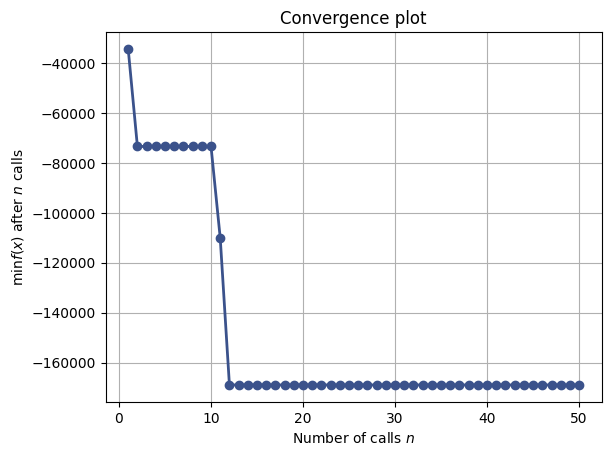

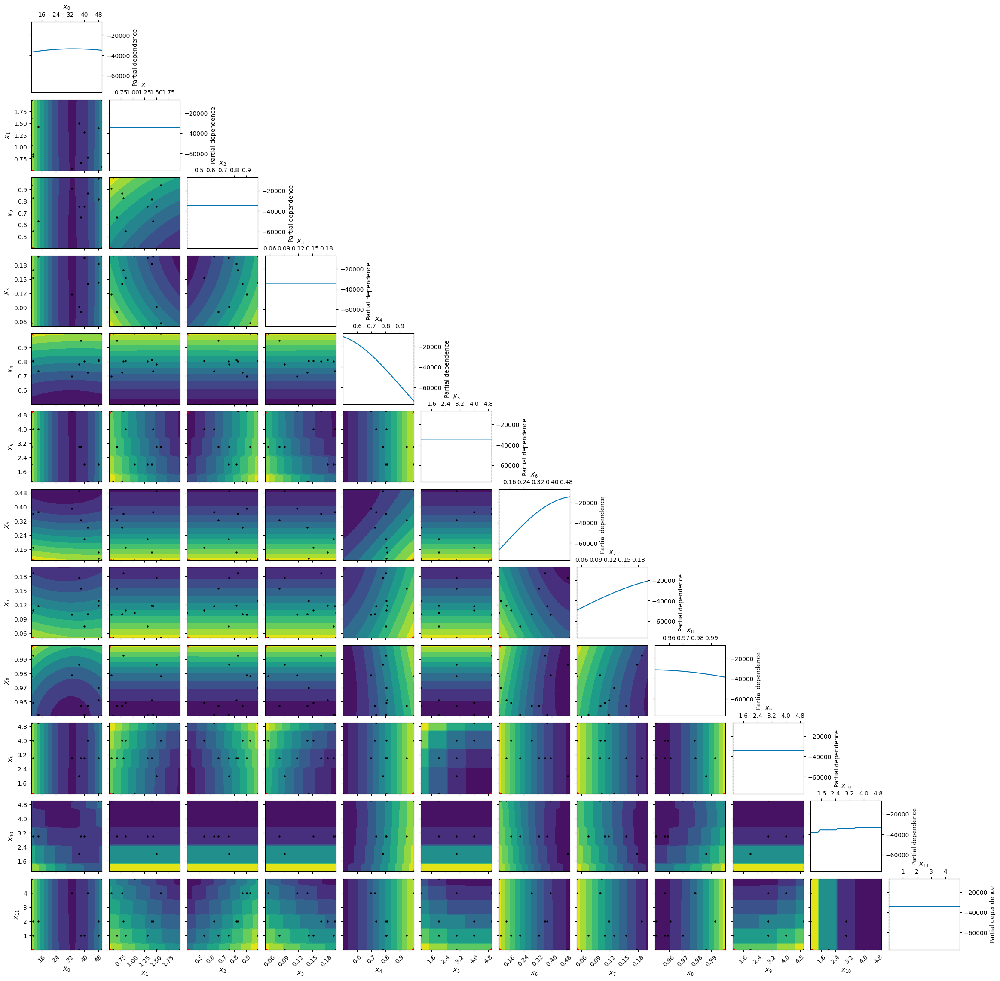

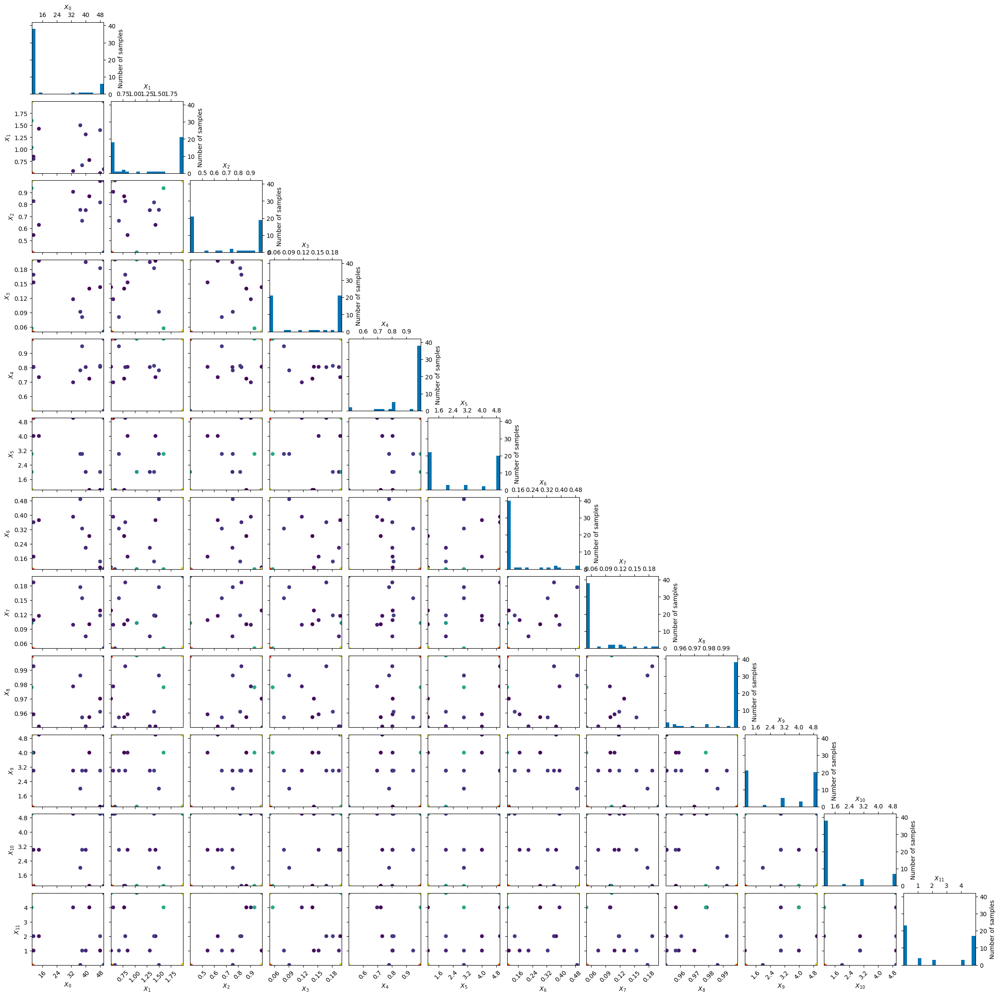

In [2]:
!pip install scikit-optimize==0.9.0

from skopt import gp_minimize
from skopt.acquisition import gaussian_ei
from skopt.plots import plot_convergence, plot_objective, plot_evaluations
from skopt.space import Real, Integer

params_fixed = {
    "dim_map": 100,
    "obstacle_coords": [(20, 20), (40, 40), (60, 60)]
}

def objective_function(params):
    param_dict = dict(zip(param_ranges.keys(), params))
    generate_wave_params = {k: v for k, v in param_dict.items() if k in ['wave_freq', 'wave_speed', 'wave_decay', 'wave_amplitude', 'wave_cutoff']}
    simulate_step_params = {k: v for k, v in param_dict.items() if k in ['wave_retreat_coeff', 'sand_pull', 'ground_pull', 'water_decay']}

    grid = initialize_coastline(params_fixed['dim_map'], params_fixed['obstacle_coords'])
    total_impact = 0

    for step in range(10):
        wave_front = generate_wave(grid, **generate_wave_params)
        grid = simulate_step(grid, wave_front, **simulate_step_params)
        total_impact += np.sum(grid)

    return -total_impact

bounds = [
    Integer(low, high) if isinstance(low, int) and isinstance(high, int) else (low, high)
    for low, high in param_ranges.values()
]


import numpy as np

np.int = int
np.int_ = int
np.bool = bool
np.bool_ = bool
np.float = float
np.float_ = float

result = gp_minimize(
    objective_function,
    bounds,
    acq_func="EI",
    n_calls=50,
    random_state=42,
)

print("Optimal parameters:", result.x)
print("Optimal objective value:", result.fun)

plot_convergence(result)
plt.show()

_ = plot_objective(result)
plt.show()

_ = plot_evaluations(result)
plt.show()

<ipython-input-3-d73acb3edee5>:13: DeprecationWarning: `salib.sample.saltelli` will be removed in SALib 1.5.1 Please use `salib.sample.sobol`
  param_values = saltelli.sample(problem, 1000)
/usr/local/lib/python3.11/dist-packages/SALib/sample/saltelli.py:110: UserWarning: 
        Convergence properties of the Sobol' sequence is only valid if
        `N` (1000) is equal to `2^n`.
        
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/SALib/util/__init__.py:274: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  names = list(pd.unique(groups))


                          ST   ST_conf
wave_freq           0.003997  0.001192
wave_speed          0.000000  0.000000
wave_decay          0.000000  0.000000
wave_cutoff         0.000000  0.000000
wave_retreat_coeff  0.501254  0.048451
wave_height         0.000000  0.000000
sand_pull           0.455750  0.042582
ground_pull         0.065784  0.006622
water_decay         0.009323  0.001259
wave_vol            0.000000  0.000000
wave_amplitude      0.005002  0.001616
wave_spread         0.000000  0.000000
                          S1   S1_conf
wave_freq          -0.002891  0.005591
wave_speed          0.000000  0.000000
wave_decay          0.000000  0.000000
wave_cutoff         0.000000  0.000000
wave_retreat_coeff  0.476131  0.054239
wave_height         0.000000  0.000000
sand_pull           0.422613  0.055771
ground_pull         0.054875  0.025125
water_decay         0.006824  0.008425
wave_vol            0.000000  0.000000
wave_amplitude     -0.002909  0.006783
wave_spread         0.000

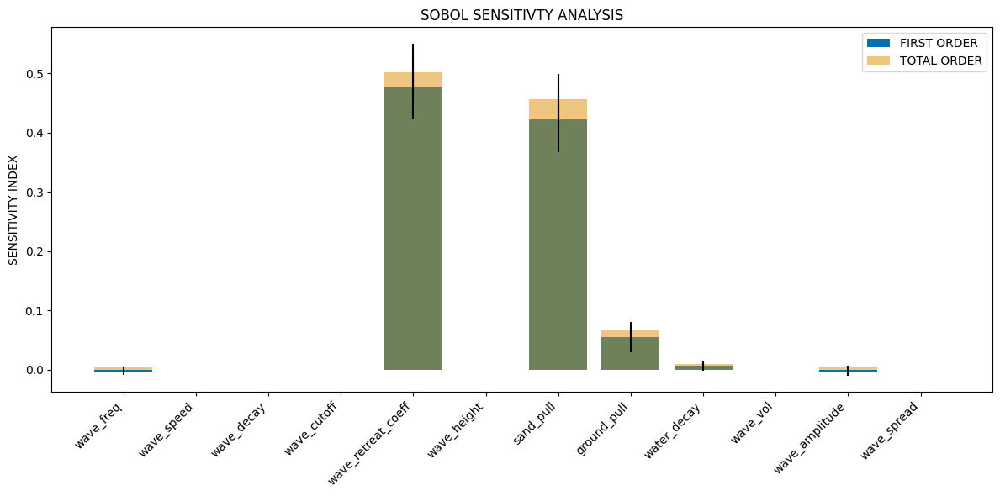

In [3]:
!pip install SALib
!pip install scikit-optimize==0.9.0

from SALib.sample import saltelli
from SALib.analyze import sobol

problem = {
    'num_vars': len(param_ranges),
    'names': list(param_ranges.keys()),
    'bounds': [list(bounds) for bounds in param_ranges.values()]
}

param_values = saltelli.sample(problem, 1000)

Y = np.zeros([param_values.shape[0]])
for i, X in enumerate(param_values):
    Y[i] = objective_function(X)

Si = sobol.analyze(problem, Y, print_to_console=True)
plt.figure(figsize=(12, 6))
plt.bar(problem['names'], Si['S1'], yerr=Si['S1_conf'], label='FIRST ORDER')
plt.bar(problem['names'], Si['ST'], yerr=Si['ST_conf'], label='TOTAL ORDER', alpha=0.5)
plt.xticks(rotation=45, ha='right')
plt.ylabel('SENSITIVITY INDEX')
plt.legend()
plt.title('SOBOL SENSITIVTY ANALYSIS')
plt.tight_layout()
plt.show()